## Time Series Analysis Project
Predict temperature in Murmansk using Time Series Analysis. 

### Imports

In [101]:
import pandas as pd
import numpy as np
import re
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score
from math import sqrt
from sklearn.preprocessing import PolynomialFeatures
from statsmodels.api import OLS, add_constant, qqplot
from statsmodels.tsa.ar_model import AutoReg, ar_select_order
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf

from sklearn.preprocessing import PowerTransformer
from sklearn.model_selection import TimeSeriesSplit, cross_val_score

import cufflinks as cf
import chart_studio.plotly as py


cf.set_config_file(world_readable=True, theme='pearl', offline=True)

cf.go_offline()
plt.rcParams['figure.figsize'] = (14,6)

### Functions

In [102]:
def plot_temp(df, title):
    df.plot()
    plt.title(title)
    plt.ylabel('Mean Temperature')
    plt.show()

In [103]:
def plot_plotly(df,title):
    df.iplot(title=title, xTitle='time period', yTitle='temperature')

## LOAD THE DATA

Data from Murmansk, daily mean temperature 

In [104]:
df = pd.read_csv('Murmansk_mean.txt')

In [105]:
df = df.drop(['STAID', ' SOUID'], axis=1)
df = df.rename(columns={'    DATE': "DATE", '   TG': "MEAN", ' Q_TG':"Q_TG_MEAN"})

In [106]:
df['DATE']=pd.to_datetime(df['DATE'], format='%Y%m%d', errors='ignore')
df['YEAR'] = pd.DatetimeIndex(df['DATE']).year
df['MONTH'] = pd.DatetimeIndex(df['DATE']).month

Replace -9999 with Nan values and get actual degrees(*0.1)

In [107]:
df.loc[df['Q_TG_MEAN']==9, 'MEAN']=float('Nan')
df['MEAN']=df['MEAN']/10

In [108]:
df = df.drop(['Q_TG_MEAN'], axis=1)

In [109]:
round(df['MEAN'].describe(),2)

count    24837.00
mean         4.74
std          5.17
min        -15.10
25%          1.10
50%          5.10
75%          9.10
max         20.10
Name: MEAN, dtype: float64

In [110]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26329 entries, 0 to 26328
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   DATE    26329 non-null  datetime64[ns]
 1   MEAN    24837 non-null  float64       
 2   YEAR    26329 non-null  int64         
 3   MONTH   26329 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(2)
memory usage: 822.9 KB


In [111]:
df.tail()

,DATE,MEAN,YEAR,MONTH
26324,2021-01-27,NaN,2021,1
26325,2021-01-28,NaN,2021,1
26326,2021-01-29,NaN,2021,1
26327,2021-01-30,NaN,2021,1
26328,2021-01-31,NaN,2021,1


Increase MEAN TEMP by 20, so we dont have - temperature and zero values

In [112]:
df['MEAN']=df['MEAN']+20

Drop years with NaN data and 2016 for our test data 

In [113]:
 df[df['MEAN'].isna()]

,DATE,MEAN,YEAR,MONTH
24837,2017-01-01,NaN,2017,1
24838,2017-01-02,NaN,2017,1
24839,2017-01-03,NaN,2017,1
24840,2017-01-04,NaN,2017,1
24841,2017-01-05,NaN,2017,1
...,...,...,...,...
26324,2021-01-27,NaN,2021,1
26325,2021-01-28,NaN,2021,1
26326,2021-01-29,NaN,2021,1
26327,2021-01-30,NaN,2021,1


In [114]:
df=df.set_index('DATE')
df = df[df.YEAR < 2017]
df[df['MEAN'].isna()]

,MEAN,YEAR,MONTH
DATE,,,


In [115]:
df.head()

,MEAN,YEAR,MONTH
DATE,,,
1949-01-01,12.7,1949,1
1949-01-02,9.7,1949,1
1949-01-03,11.0,1949,1
1949-01-04,11.7,1949,1
1949-01-05,17.3,1949,1


Plot temperature in 2010-2015

In [116]:
plot_plotly(df.loc[df['YEAR']>2010,['MEAN']],'Temperature in 2010-2015')

In [117]:
plot_plotly(df.loc[df['YEAR']==2000,['MEAN']],'Temperature in 2000')

In [118]:
plot_plotly(df.groupby('YEAR')['MEAN'].mean(), 'Mean temperature through the years')

In [119]:
df.describe()

,MEAN,YEAR,MONTH
count,24837.000000,24837.000000,24837.000000
mean,24.742247,1982.501027,6.522930
std,5.168825,19.628199,3.448773
min,4.900000,1949.000000,1.000000
25%,21.100000,1966.000000,4.000000
50%,25.100000,1983.000000,7.000000
75%,29.100000,2000.000000,10.000000
max,40.100000,2016.000000,12.000000


### CHECK OUTLIERS AND DISTRIBUTION

In [120]:
df['MEAN'].iplot(kind='hist', xTitle='temperature',
                  yTitle='counts', title='Temperature Distribution through all period 1949-2015 in Murmansk')

Clean outliers(extrimely high and low temp >35 and <9)

In [121]:
def replace_outliers(df,n,max_t,min_t,b):
    l=[]
    if b:
        for i in range(0,len(df.loc[df['MEAN']>n, 'MEAN'])):
            l.append(np.random.uniform(min_t, max_t))
        df.loc[df['MEAN']>n, 'MEAN']=l 
    else:
        for i in range(0,len(df.loc[df['MEAN']<n, 'MEAN'])):
            l.append(np.random.uniform(min_t, max_t))
        df.loc[df['MEAN']<n, 'MEAN']=l 
    return df      

In [122]:
df=replace_outliers(df,35,35,33,True)
df=replace_outliers(df,9,11,9,False)

In [123]:
df['MEAN'].iplot(kind='hist', xTitle='temperature',
                  yTitle='counts', title='Temperature Distribution through all period 1949-2015 in Murmansk')

We can see Weibull distribution, we can try to transform our data to get Gaussian distribution
In many modeling scenarios, normality of the features in a dataset is desirable. Power transforms are a family of parametric, monotonic transformations that aim to map data from any distribution to as close to a Gaussian distribution as possible in order to stabilize variance and minimize skewness.

In [124]:
pt = PowerTransformer(method='yeo-johnson', standardize=False)

In [125]:
df['TRANS']=pt.fit_transform(df[['MEAN']])

In [126]:
df['TRANS'].iplot(kind='hist', xTitle='temperature',
                  yTitle='counts', title='Temperature Distribution through all period 1949-2015 in Murmansk')

Split to train and test data

In [127]:
df_test = df[df.YEAR == 2016]
df = df[df.YEAR < 2016]

In [128]:
df_test.head(2), df_test.tail(2), df.head(2), df.tail(2)

(            MEAN  YEAR  MONTH       TRANS
 DATE                                     
 2016-01-01  20.2  2016      1  108.912471
 2016-01-02  18.7  2016      1   95.970792,
             MEAN  YEAR  MONTH      TRANS
 DATE                                    
 2016-12-30  17.3  2016     12  84.509854
 2016-12-31  18.2  2016     12  91.808439,
             MEAN  YEAR  MONTH      TRANS
 DATE                                    
 1949-01-01  12.7  1949      1  51.223178
 1949-01-02   9.7  1949      1  33.332451,
             MEAN  YEAR  MONTH       TRANS
 DATE                                     
 2015-12-30  22.0  2015     12  125.327076
 2015-12-31  20.7  2015     12  113.376146)

## Model The Trend

In [129]:
df['STEP'] = list(range(len(df)))

In [130]:
m_step = LinearRegression()

X = df[['STEP']]
y = df['TRANS']
m_step.fit(X, y)

LinearRegression()

In [131]:
y_step_pred = m_step.predict(X)
df['TREND'] = y_step_pred

In [132]:
def validate_model(y, y_pred):
    rmse = np.sqrt(mean_squared_error(y,y_pred))
    r2 = r2_score(y, y_pred)
    print(rmse)
    print(r2)

In [133]:
validate_model(y, y_step_pred)

50.8739974026726
0.001334966603866894


In [134]:
plot_plotly(df[['TRANS', 'TREND']], 'Trend and original data')

Add polynomial Features

In [135]:
pol_f= PolynomialFeatures(degree=3)
X_poly = pol_f.fit_transform(X)
m_poly=LinearRegression()
m_poly.fit(X_poly, y)
y_poly_pred=m_poly.predict(X_poly)
df['TREND_POL'] = y_poly_pred

In [136]:
validate_model(y, y_poly_pred)

50.7658431438745
0.00557662527358227


Add Polynomial features to our df

In [137]:
df_p = pd.DataFrame(X_poly, columns=['P1','P2','P3','P4'], index=df.index)
df=df.join(df_p)

In [138]:
plot_plotly(df[['TRANS', 'TREND_POL']], 'Trend with Polynomial features and original data')

## Model Seasonality

We add monthes as dummies and do prediction with seasonality

In [139]:
df = df.join(pd.get_dummies(df['MONTH'], prefix='M', drop_first=True))

In [140]:
df.head()

,MEAN,YEAR,MONTH,TRANS,STEP,TREND,TREND_POL,P1,P2,P3,...,M_3,M_4,M_5,M_6,M_7,M_8,M_9,M_10,M_11,M_12
DATE,,,,,,,,,,,,,,,,,,,,,
1949-01-01,12.7,1949,1,51.223178,0,152.513778,156.760001,1.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1949-01-02,9.7,1949,1,33.332451,1,152.514041,156.759905,1.0,1.0,1.0,...,0,0,0,0,0,0,0,0,0,0
1949-01-03,11.0,1949,1,40.698416,2,152.514304,156.759810,1.0,2.0,4.0,...,0,0,0,0,0,0,0,0,0,0
1949-01-04,11.7,1949,1,44.911562,3,152.514568,156.759714,1.0,3.0,9.0,...,0,0,0,0,0,0,0,0,0,0
1949-01-05,17.3,1949,1,84.509854,4,152.514831,156.759618,1.0,4.0,16.0,...,0,0,0,0,0,0,0,0,0,0


In [141]:
m_seas = LinearRegression()
X = df.drop(['MEAN','YEAR', 'MONTH', 'TRANS','STEP', 'TREND','TREND_POL'], axis=1)

In [142]:
y = df['TRANS']
m_seas.fit(X, y)

LinearRegression()

In [143]:
y_seas_pred = m_seas.predict(X)
df['SEASONAL']=y_seas_pred

In [144]:
df

,MEAN,YEAR,MONTH,TRANS,STEP,TREND,TREND_POL,P1,P2,P3,...,M_4,M_5,M_6,M_7,M_8,M_9,M_10,M_11,M_12,SEASONAL
DATE,,,,,,,,,,,,,,,,,,,,,
1949-01-01,12.7,1949,1,51.223178,0,152.513778,156.760001,1.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,110.753666
1949-01-02,9.7,1949,1,33.332451,1,152.514041,156.759905,1.0,1.0,1.0,...,0,0,0,0,0,0,0,0,0,110.753274
1949-01-03,11.0,1949,1,40.698416,2,152.514304,156.759810,1.0,2.0,4.0,...,0,0,0,0,0,0,0,0,0,110.752882
1949-01-04,11.7,1949,1,44.911562,3,152.514568,156.759714,1.0,3.0,9.0,...,0,0,0,0,0,0,0,0,0,110.752490
1949-01-05,17.3,1949,1,84.509854,4,152.514831,156.759618,1.0,4.0,16.0,...,0,0,0,0,0,0,0,0,0,110.752098
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-12-27,22.5,2015,12,130.055126,24466,158.955812,168.756448,1.0,24466.0,598585156.0,...,0,0,0,0,0,0,0,0,1,122.897017
2015-12-28,22.5,2015,12,130.055126,24467,158.956075,168.759798,1.0,24467.0,598634089.0,...,0,0,0,0,0,0,0,0,1,122.900077
2015-12-29,21.2,2015,12,117.913875,24468,158.956339,168.763149,1.0,24468.0,598683024.0,...,0,0,0,0,0,0,0,0,1,122.903137


In [145]:
plot_plotly(df[['TRANS', 'SEASONAL']], 'Seasonal trend and original data')

In [146]:
validate_model(y, y_seas_pred)

29.272080339820874
0.6693753010236398


Not transformed data Test RMSE: 3.126
Test R2: 0.635

##  Extract the remainder

In [147]:
# We want to extract the part of the model that the trend_seasonal is not able to explain
df['REMAINDER'] = df['TRANS'] - df['SEASONAL'] #seasonality

In [148]:
plot_plotly(df['REMAINDER'], title='Remainder after modelling trend and seasonality')

In [149]:
df['REMAINDER'].iplot(kind='hist', xTitle='temperature',
                  yTitle='counts', title='Reminder distribution')

In [150]:
df['REMAINDER'].to_csv('murmansk_remainder.csv')

## AUTOREGRESSIVE MODEL (LINEAR REGRESSION)

Results for shift 1
Results for shift 2
Results for shift 3


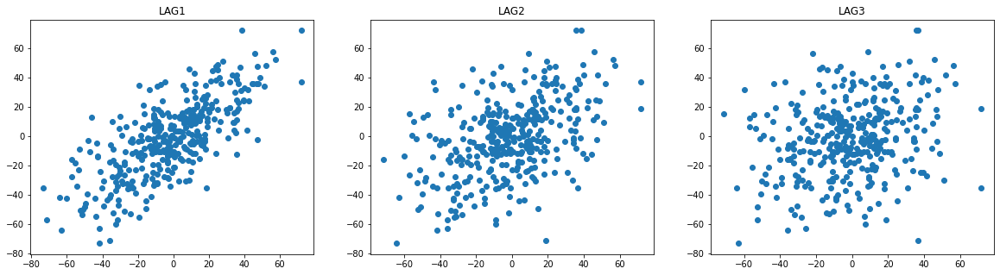

In [151]:
plt.figure(figsize=[20,5])
lags=3
for i in range(1,lags+1):
    name='LAG'+str(i)
    df[name] = df['REMAINDER'].shift(i)
    plt.subplot(1,lags,i)
    print(f'Results for shift {i}')
    plt.title(name)  
    plt.scatter(x=df.loc[df['YEAR']==2000, name], y=df.loc[df['YEAR']==2000, ['REMAINDER']], label=name)

In [152]:
df[['REMAINDER','LAG1','LAG2','LAG3']].corr()

,REMAINDER,LAG1,LAG2,LAG3
REMAINDER,1.000000,0.754600,0.525884,0.397118
LAG1,0.754600,1.000000,0.754602,0.525883
LAG2,0.525884,0.754602,1.000000,0.754604
LAG3,0.397118,0.525883,0.754604,1.000000


In [153]:
df.dropna(inplace=True)

## Run an Autoregression (Linear Regression) of lag1 on the remainder

In [154]:
m_lag=LinearRegression()
X=df[['LAG1']]
y=df['REMAINDER']
m_lag.fit(X,y)

LinearRegression()

In [155]:
y_lag_pred = m_lag.predict(X)
df['PRED_LAG1'] = y_lag_pred 

In [156]:
validate_model(y, y_lag_pred)

19.20620216647417
0.5692533519002495


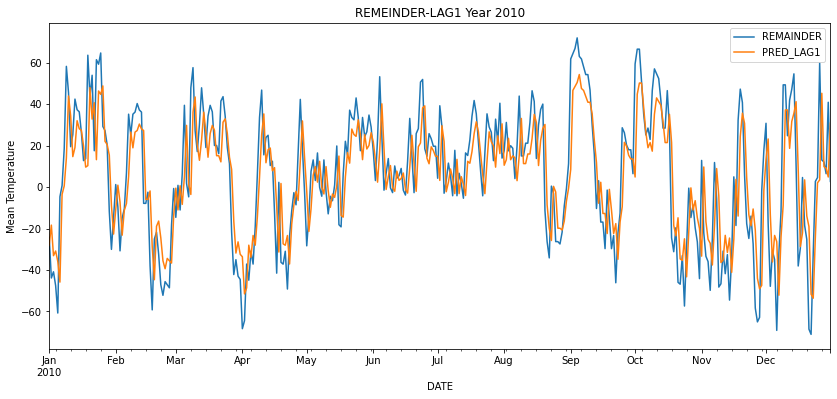

In [157]:
plot_temp(df.loc[df['YEAR']==2010, ['REMAINDER', 'PRED_LAG1']], 'REMEINDER-LAG1 Year 2010')

Residual compare to remainder

In [158]:
df['RESIDUAL'] = df['REMAINDER'] - df['PRED_LAG1']

Partial Auto Correlation and Auto Correlation function

Text(0.5, 0, 'lags')

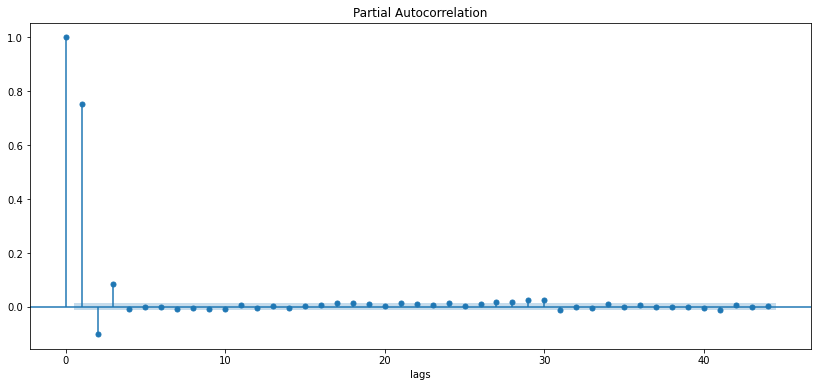

In [159]:
plot_pacf(df['REMAINDER'])
plt.xlabel('lags')

From this plot we can choose how many Lags we can use. The correlation is strong between first 3 Lags

Text(0.5, 0, 'lags')

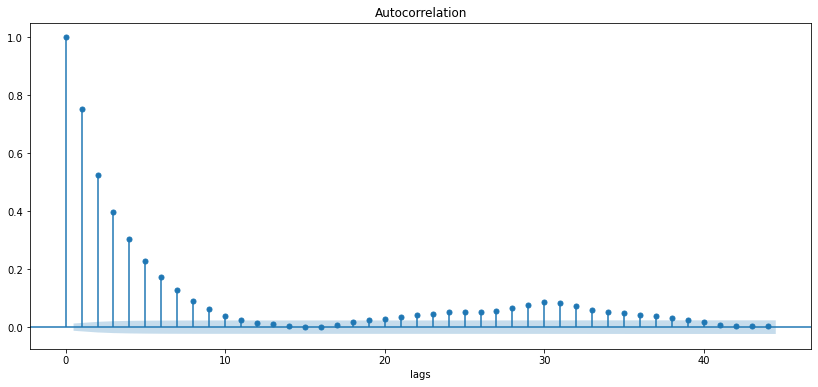

In [160]:
plot_acf(df['REMAINDER'])
plt.xlabel('lags')

We can also use Auto Regression model to choose Lags

In [161]:
selected_order = ar_select_order(df['REMAINDER'], maxlag = 12)

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/statsmodels/tsa/ar_model.py:248: FutureWarning:

The parameter names will change after 0.12 is released. Set old_names to False to use the new names now. Set old_names to True to use the old names. 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/statsmodels/tsa/ar_model.py:248: FutureWarning:

The parameter names will change after 0.12 is released. Set old_names to False to use the new names now. Set old_names to True to use the old names. 



In [162]:
selected_order.ar_lags

array([1, 2, 3])

This model also gave us 3 Lags

We take another 2 Lags and train Linear Regression on those features

In [163]:
m_lags=LinearRegression()
X=df[['LAG1', 'LAG2', 'LAG3']]
y=df['REMAINDER']
m_lags.fit(X,y)

LinearRegression()

In [164]:
y_lags_pred = m_lags.predict(X)
df['PRED_LAGS'] = y_lags_pred

In [165]:
validate_model(y, y_lags_pred)


19.037770283037446
0.5767752287085635


Scores from only first Lag 
Test RMSE: 19.360
Test R2: 0.569

In [166]:
plot_plotly(df.loc[df['YEAR']==2000, ['REMAINDER', 'PRED_LAGS']], 'REMEINDER - 3 Lags')

## Making final model and prediction

In [167]:
df.columns

Index(['MEAN', 'YEAR', 'MONTH', 'TRANS', 'STEP', 'TREND', 'TREND_POL', 'P1',
       'P2', 'P3', 'P4', 'M_2', 'M_3', 'M_4', 'M_5', 'M_6', 'M_7', 'M_8',
       'M_9', 'M_10', 'M_11', 'M_12', 'SEASONAL', 'REMAINDER', 'LAG1', 'LAG2',
       'LAG3', 'PRED_LAG1', 'RESIDUAL', 'PRED_LAGS'],
      dtype='object')

In [168]:
X_final=df[['P1','P2', 'P3', 'P4', 'M_2', 'M_3',
       'M_4', 'M_5', 'M_6', 'M_7', 'M_8', 'M_9', 'M_10', 'M_11', 'M_12',
       'LAG1', 'LAG2', 'LAG3']]
y=df['TRANS']

In [169]:
m_f = LinearRegression()
m_f.fit(X_final,y)
y_final_pred = m_f.predict(X_final)

In [170]:
df['FIN_PRED']=y_final_pred

In [171]:
validate_model(y, y_final_pred)

19.03676617271362
0.8600962489997179


In [172]:
plot_plotly(df.loc[df['YEAR']==2015, ['TRANS', 'FIN_PRED']], 'Final prediction 2015')

In [173]:
df['REMAINDER'].std()

29.26438606997244

### Evaluating Model

In [174]:
ts_split = TimeSeriesSplit(n_splits=5)
time_series_split = ts_split.split(X_final, y) 

In [175]:
result = cross_val_score(estimator=m_f, X=X_final, y=y,
                         cv=time_series_split)
result

array([0.82064534, 0.84530241, 0.85318325, 0.86033102, 0.84533627])

In [176]:
result_ordinary_cv = cross_val_score(estimator=m_f, X=X_final, y=y, cv=5)
result_ordinary_cv

array([0.85172727, 0.84885573, 0.85154909, 0.86103176, 0.8507708 ])

### Predict future 1 day

In [177]:
df_test.head(2)

,MEAN,YEAR,MONTH,TRANS
DATE,,,,
2016-01-01,20.2,2016,1,108.912471
2016-01-02,18.7,2016,1,95.970792


In [178]:
X_test=df_test.drop(["MEAN","TRANS"], axis=1)

In [179]:
y_test=df_test['TRANS']

Add timestep

In [180]:
last_timestep = df['STEP'][-1]
X_test['STEP']=list(range(last_timestep + 1, len(df_test) + last_timestep+1))

Add polynomial features

In [181]:
pol_f= PolynomialFeatures(degree=3)
X_poly = pol_f.fit_transform(X_test[['STEP']])

In [182]:
df_p = pd.DataFrame(X_poly, columns=['P1','P2','P3','P4'], index=X_test.index)
X_test=X_test.join(df_p)

Add Dummies Months

In [183]:
X_test = X_test.join(pd.get_dummies(X_test['MONTH'], prefix='M', drop_first=True))

Add LAGs

In [184]:
X_test['LAG1']=[0]*len(X_test)
X_test['LAG2']=[0]*len(X_test)
X_test['LAG3']=[0]*len(X_test)

In [185]:
X_test=X_test.drop(['YEAR', 'MONTH','STEP'], axis=1)

Add lags from previous data


In [186]:
X_test.loc['2016-01-01', 'LAG1'] = df.loc['2015-12-31', 'REMAINDER']
X_test.loc['2016-01-01', 'LAG2'] = df.loc['2015-12-31', 'LAG1']
X_test.loc['2016-01-01', 'LAG3'] = df.loc['2015-12-31', 'LAG2']


Predict one day

In [187]:
y_test_pred = m_f.predict(X_test.head(1))

In [188]:
y_test_pred, df_test['TRANS'][0]

(array([112.54057583]), 108.9124705949691)

In [190]:
print(f'Predicted temperature 01-01-2016...{round((pt.inverse_transform([y_test_pred])[0][0]-20), 2)}')
print(f'Real temperature 01-01-2016...{round((df_test["MEAN"][0]-20), 2)}')

Predicted temperature 01-01-2016...0.61
Real temperature 01-01-2016...0.2


## Use prediction for one day to predict next day, make one week prediction

Add Seasonality and REMAINDER column

In [191]:
X_test['SEASONAL']=m_seas.predict(X_test.drop(['LAG1','LAG2','LAG3'], axis=1))
X_test['REMAINDER']=[0.0]*len(X_test)
X_test['TRANS']= [0.0]*len(X_test)

Make prediction for one week 7 days

In [192]:
for i in range(1,8):
    X_m = X_test.drop(['TRANS', 'REMAINDER', 'SEASONAL'], axis=1)
    y_test_pred = m_f.predict(X_m.head(i))
    X_test['TRANS'][i-1]=y_test_pred[i-1]
    X_test['REMAINDER'][i-1]=X_test['TRANS'][i-1]-X_test['SEASONAL'][i-1]
    X_test['LAG1'][i]=X_test['REMAINDER'][i-1]
    X_test['LAG2'][i]=X_test['LAG1'][i-1]
    X_test['LAG3'][i]=X_test['LAG2'][i-1]

In [193]:
X_test.head(10)

,P1,P2,P3,P4,M_2,M_3,M_4,M_5,M_6,M_7,...,M_9,M_10,M_11,M_12,LAG1,LAG2,LAG3,SEASONAL,REMAINDER,TRANS
DATE,,,,,,,,,,,,,,,,,,,,,
2016-01-01,1.0,24471.0,598829841.0,1.465397e+13,0,0,0,0,0,0,...,0,0,0,0,-9.533112,2.420878,-4.989262,121.167981,-8.627405,112.540576
2016-01-02,1.0,24472.0,598878784.0,1.465576e+13,0,0,0,0,0,0,...,0,0,0,0,-8.627405,-9.533112,2.420878,121.171043,-5.174132,115.996910
2016-01-03,1.0,24473.0,598927729.0,1.465756e+13,0,0,0,0,0,0,...,0,0,0,0,-5.174132,-8.627405,-9.533112,121.174104,-3.457022,117.717082
2016-01-04,1.0,24474.0,598976676.0,1.465936e+13,0,0,0,0,0,0,...,0,0,0,0,-3.457022,-5.174132,-8.627405,121.177167,-2.532701,118.644466
2016-01-05,1.0,24475.0,599025625.0,1.466115e+13,0,0,0,0,0,0,...,0,0,0,0,-2.532701,-3.457022,-5.174132,121.180229,-1.756402,119.423827
2016-01-06,1.0,24476.0,599074576.0,1.466295e+13,0,0,0,0,0,0,...,0,0,0,0,-1.756402,-2.532701,-3.457022,121.183292,-1.116755,120.066537
2016-01-07,1.0,24477.0,599123529.0,1.466475e+13,0,0,0,0,0,0,...,0,0,0,0,-1.116755,-1.756402,-2.532701,121.186355,-0.634300,120.552055
2016-01-08,1.0,24478.0,599172484.0,1.466654e+13,0,0,0,0,0,0,...,0,0,0,0,-0.634300,-1.116755,-1.756402,121.189419,0.000000,0.000000
2016-01-09,1.0,24479.0,599221441.0,1.466834e+13,0,0,0,0,0,0,...,0,0,0,0,0.000000,0.000000,0.000000,121.192483,0.000000,0.000000


In [194]:
X_test['REAL_TRANS']=pt.inverse_transform(X_test[['TRANS']])-20

In [195]:
X_test['REAL']=df_test['MEAN']-20

In [196]:
X_test

,P1,P2,P3,P4,M_2,M_3,M_4,M_5,M_6,M_7,...,M_11,M_12,LAG1,LAG2,LAG3,SEASONAL,REMAINDER,TRANS,REAL_TRANS,REAL
DATE,,,,,,,,,,,,,,,,,,,,,
2016-01-01,1.0,24471.0,598829841.0,1.465397e+13,0,0,0,0,0,0,...,0,0,-9.533112,2.420878,-4.989262,121.167981,-8.627405,112.540576,0.607033,0.2
2016-01-02,1.0,24472.0,598878784.0,1.465576e+13,0,0,0,0,0,0,...,0,0,-8.627405,-9.533112,2.420878,121.171043,-5.174132,115.996910,0.989766,-1.3
2016-01-03,1.0,24473.0,598927729.0,1.465756e+13,0,0,0,0,0,0,...,0,0,-5.174132,-8.627405,-9.533112,121.174104,-3.457022,117.717082,1.178483,-0.4
2016-01-04,1.0,24474.0,598976676.0,1.465936e+13,0,0,0,0,0,0,...,0,0,-3.457022,-5.174132,-8.627405,121.177167,-2.532701,118.644466,1.279751,3.1
2016-01-05,1.0,24475.0,599025625.0,1.466115e+13,0,0,0,0,0,0,...,0,0,-2.532701,-3.457022,-5.174132,121.180229,-1.756402,119.423827,1.364601,-0.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-27,1.0,24832.0,616628224.0,1.531211e+13,0,0,0,0,0,0,...,0,1,0.000000,0.000000,0.000000,124.041300,0.000000,0.000000,-20.000000,5.6
2016-12-28,1.0,24833.0,616677889.0,1.531396e+13,0,0,0,0,0,0,...,0,1,0.000000,0.000000,0.000000,124.044494,0.000000,0.000000,-20.000000,0.7
2016-12-29,1.0,24834.0,616727556.0,1.531581e+13,0,0,0,0,0,0,...,0,1,0.000000,0.000000,0.000000,124.047688,0.000000,0.000000,-20.000000,2.9


In [197]:
plot_plotly(X_test.loc[X_test.index<'2016-01-08', ['REAL','REAL_TRANS']], 'Final prediction 2016 first week')